### Problem statement
## **Predict the total ride of taxi trips in new York city**

Predicting the duration of each taxi trip at the point when the trip starts helps them to plan their fleet in a much better manner

### Load libraries

In [18]:
%matplotlib inline
import numpy as np
import pandas as pd
from datetime import timedelta
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

### Import dataset

In [2]:
data=pd.read_csv("nyc_taxi_trip_duration.csv")

### Data Exploration

In [3]:
data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id1080784,2,2016-02-29 16:40:21,2016-02-29 16:47:01,1,-73.953918,40.778873,-73.963875,40.771164,N,400
1,id0889885,1,2016-03-11 23:35:37,2016-03-11 23:53:57,2,-73.988312,40.731743,-73.994751,40.694931,N,1100
2,id0857912,2,2016-02-21 17:59:33,2016-02-21 18:26:48,2,-73.997314,40.721458,-73.948029,40.774918,N,1635
3,id3744273,2,2016-01-05 09:44:31,2016-01-05 10:03:32,6,-73.961670,40.759720,-73.956779,40.780628,N,1141
4,id0232939,1,2016-02-17 06:42:23,2016-02-17 06:56:31,1,-74.017120,40.708469,-73.988182,40.740631,N,848


### Feature details:

- id - a unique identifier for each trip
- vendor_id - a code indicating the provider associated with the trip record
- pickup_datetime - date and time when the meter was engaged
- dropoff_datetime - date and time when the meter was disengaged
- passenger_count - the number of passengers in the vehicle (driver entered value)
- pickup_longitude - the longitude where the meter was engaged
- pickup_latitude - the latitude where the meter was engaged
- dropoff_longitude - the longitude where the meter was disengaged
- dropoff_latitude - the latitude where the meter was disengaged
- store_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip.

### Label details:

- trip_duration - duration of the trip in seconds

In [4]:
# check the shape of the dataset
data.shape

(729322, 11)

In [5]:
# check whether there are null values
data.isnull().sum()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

### Result:
####  There are no null values in the dataset 

In [6]:
# check the datatype in the dataset
data.dtypes

id                     object
vendor_id               int64
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
pickup_longitude      float64
pickup_latitude       float64
dropoff_longitude     float64
dropoff_latitude      float64
store_and_fwd_flag     object
trip_duration           int64
dtype: object

In [3]:
# convert pickup_datetime and dropoff_datetime to datetime format
data['pickup_datetime'] = pd.to_datetime(data['pickup_datetime'])
data['dropoff_datetime'] = pd.to_datetime(data['dropoff_datetime'])

In [4]:
# calculate and assign new columns with week_day, month, pickup hour 
data['weekday'] = data.pickup_datetime.dt.day_name()
data['month'] = data.pickup_datetime.dt.month
data['weekday_num'] = data.pickup_datetime.dt.weekday
data['pick_up_hour'] = data.pickup_datetime.dt.hour 

In [5]:
data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,weekday,month,weekday_num,pick_up_hour
0,id1080784,2,2016-02-29 16:40:21,2016-02-29 16:47:01,1,-73.953918,40.778873,-73.963875,40.771164,N,400,Monday,2,0,16
1,id0889885,1,2016-03-11 23:35:37,2016-03-11 23:53:57,2,-73.988312,40.731743,-73.994751,40.694931,N,1100,Friday,3,4,23
2,id0857912,2,2016-02-21 17:59:33,2016-02-21 18:26:48,2,-73.997314,40.721458,-73.948029,40.774918,N,1635,Sunday,2,6,17
3,id3744273,2,2016-01-05 09:44:31,2016-01-05 10:03:32,6,-73.961670,40.759720,-73.956779,40.780628,N,1141,Tuesday,1,1,9
4,id0232939,1,2016-02-17 06:42:23,2016-02-17 06:56:31,1,-74.017120,40.708469,-73.988182,40.740631,N,848,Wednesday,2,2,6


In [10]:
from haversine import haversine

In [11]:
# calculate distance between pickup and dropoff coordinates using haversine formula
def calc_distance(data):
    pickup = (data['pickup_latitude'], data['pickup_longitude'])
    drop = (data['dropoff_latitude'], data['dropoff_longitude'])
    return haversine(pickup, drop)

In [ ]:
# calculate distance and assign new column to dataframe
data['Distance'] = data.apply(lambda x: calc_distance(x), axis = 1)

In [ ]:
# calculate speed in km/hr
data['speed'] = (data.Distance/(data.trip_duration/3600))

In [ ]:
data.dtypes.reset_index()

In [ ]:
#Dummify all the categorical features like "store_and_fwd_flag, vendor_id, month, weekday_num, pickup_hour, passenger_count"
dummy = pd.get_dummies(data.store_and_fwd_flag, prefix='flag')
dummy.drop(dummy.columns[0], axis=1, inplace=True) #avoid dummy trap
data = pd.concat([data,dummy], axis = 1)

dummy = pd.get_dummies(data.vendor_id, prefix='vendor_id')
dummy.drop(dummy.columns[0], axis=1, inplace=True) 
data = pd.concat([data,dummy], axis = 1)

dummy = pd.get_dummies(data.month, prefix='month')
dummy.drop(dummy.columns[0], axis=1, inplace=True) 
data = pd.concat([data,dummy], axis = 1)

dummy = pd.get_dummies(data.weekday_num, prefix='weekday_num')
dummy.drop(dummy.columns[0], axis=1, inplace=True) 
data = pd.concat([data,dummy], axis = 1)

dummy = pd.get_dummies(data.pick_up_hour, prefix='pickup_hour')
dummy.drop(dummy.columns[0], axis=1, inplace=True) 
data = pd.concat([data,dummy], axis = 1)

dummy = pd.get_dummies(data.passenger_count, prefix='passenger_count')
dummy.drop(dummy.columns[0], axis=1, inplace=True) 
data = pd.concat([data,dummy], axis = 1)


In [ ]:
data.head()

In [ ]:
data.columns

### Univariate analysis

### Passenger count

### New York City Taxi Passenger Limit says:

- A maximum of 4 passengers can ride in traditional cabs, there are also 5 passenger cabs that look more like minivans.
- A child under 7 is allowed to sit on a passenger's lap in the rear seat in addition to the passenger limit.

#### So, in total we can assume that maximum 6 passenger can board the new york taxi i.e. 5 adult + 1 minor

In [18]:
data.passenger_count.value_counts()

1    517415
2    105097
5     38926
3     29692
6     24107
4     14050
0        33
7         1
9         1
Name: passenger_count, dtype: int64

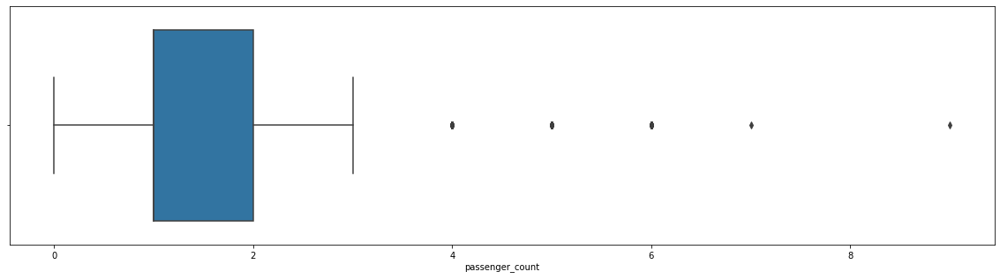

In [19]:
plt.figure(figsize = (20,5))
sns.boxplot(data.passenger_count)
plt.show()

### Observation
- Most of the trips are either 1 or 2
- There are 0 passenger count
- Few trips consisted of even 7, 8 or 9 passengers. Clear outliers and pointers to data inconsistency

### Idea:
Passenger count is a driver entered value. Since the trip is not possible without passengers. So the driver forgot to enter the value for the trips with 0 passenger count. Lets analyze the passenger count distribution further to make it consistent for further analysis



In [20]:
data['passenger_count'].describe()

count    729322.000000
mean          1.662055
std           1.312446
min           0.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           9.000000
Name: passenger_count, dtype: float64

##### As per above details. Mean median and mode are all approx equal to 1. So we would replace the 0 passenger count with 1.

In [21]:
data['passenger_count'] = data.passenger_count.map(lambda x: 1 if x == 0 else x)

#### Also, we will remove the records with passenger count > 7, 8 or 9 as they are extreme values and looks very odd to be ocupied in a taxi.

In [22]:
data = data[data.passenger_count <= 6]

In [23]:
data.passenger_count.value_counts()

1    517448
2    105097
5     38926
3     29692
6     24107
4     14050
Name: passenger_count, dtype: int64

### Data is consistent. 

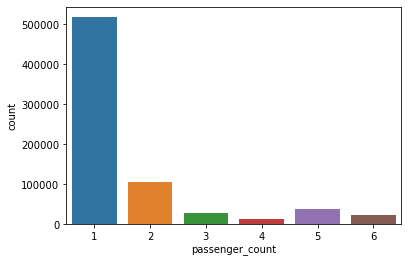

In [24]:
# Distribution with the graph
sns.countplot(data.passenger_count)
plt.show()

### Observation
- Most of the trips was taken by single passenger and that is inline with our day to day observations

### Vendor

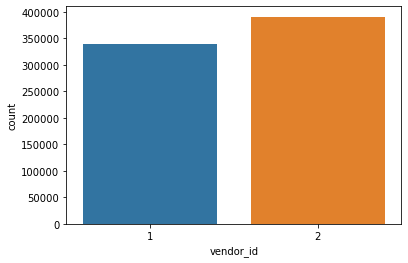

In [25]:
sns.countplot(data.vendor_id)
plt.show()

### Observation
- Vendor 2 is evidently more famous among the population as per the above graph. It has more number of trips as compared to vendor 1
- Vendor 2 has greater market share than vendor 1

### Distance

In [26]:
# Distribution of distance at different rides
data['Distance'].describe()

count    729320.000000
mean          3.441153
std           4.353140
min           0.000000
25%           1.232700
50%           2.095678
75%           3.876491
max        1240.910391
Name: Distance, dtype: float64

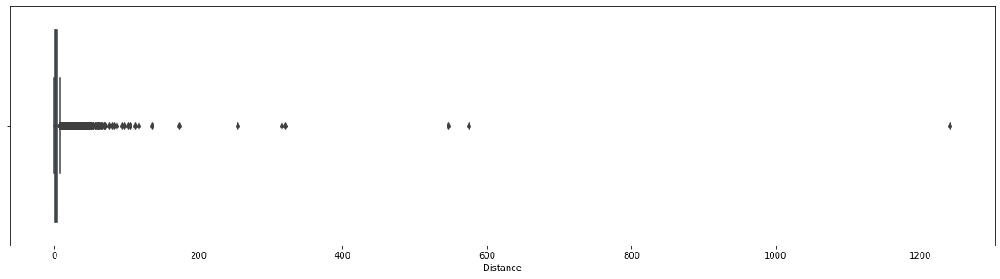

In [27]:
plt.figure(figsize = (20,5))
sns.boxplot(data.Distance)
plt.show()

### Findings
- There are trips where more than 100km distance
- Some of the trips whosee distance value is 0km

### Observations
- mean distance travelled is approx 3.5 kms.
- standard deviation of 4.3 which shows that most of the trips are limited to the range of 1-10 kms.

In [28]:
print("There are {} trip records with 0 km distance".format(data.Distance[data.Distance == 0 ].count()))

There are 2900 trip records with 0 km distance


In [29]:
data[data.Distance==0].head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,pickup_hour_22,pickup_hour_23,passenger_count_1,passenger_count_2,passenger_count_3,passenger_count_4,passenger_count_5,passenger_count_6,passenger_count_7,passenger_count_9
263,id3155891,2,2016-06-28 11:21:00,2016-06-28 11:25:00,2,-73.996422,40.298828,-73.996422,40.298828,N,...,0,0,0,1,0,0,0,0,0,0
327,id0786923,2,2016-03-26 13:34:38,2016-03-26 13:37:17,1,-73.996323,40.753460,-73.996323,40.753460,N,...,0,0,1,0,0,0,0,0,0,0
795,id2323213,2,2016-06-13 16:49:52,2016-06-13 17:04:49,5,-73.967171,40.763500,-73.967171,40.763500,N,...,0,0,0,0,0,0,1,0,0,0
1176,id3235868,1,2016-02-29 21:39:52,2016-02-29 21:44:08,1,-73.995232,40.744038,-73.995232,40.744038,N,...,0,0,1,0,0,0,0,0,0,0
1257,id1865738,2,2016-03-13 11:38:36,2016-03-13 12:00:46,2,-73.912781,40.804428,-73.912781,40.804428,N,...,0,0,0,1,0,0,0,0,0,0


### Observation
#### Around 3K trip record with distance equal to 0. Below are some possible explanation for such records.

1) Customer changed mind and cancelled the journey just after accepting it.

2) Software didn't recorded dropoff location properly due to which dropoff location is the same as the pickup location.

3) Issue with GPS tracker while the journey is being finished.

4) Driver cancelled the trip just after accepting it due to some reason. So the trip couldn't start

5) Or some other issue with the software itself which a technical guy can explain

There is some serious inconsistencies in the data where drop off location is same as the pickup location. Imputing the distance values is not possible by considering a correlation with the duration, then the dropoff_location coordinates would not be inline with the distance otherwise.

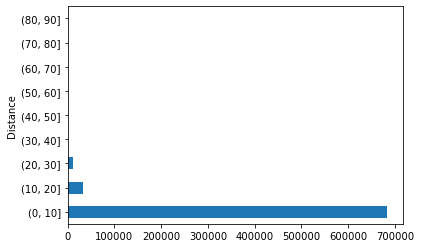

In [30]:
data.Distance.groupby(pd.cut(data.Distance, np.arange(0,100,10))).count().plot(kind='barh')
plt.show()

### Observation
- Most of the rides are completed between 1-10 Kms with some of the rides with distances between 10-30 kms. 
- Other slabs bar are not visible because the number of trips are very less as compared to these slabs

### Trip Duration

In [31]:
data.trip_duration.describe()

count    7.293200e+05
mean     9.522310e+02
std      3.864631e+03
min      1.000000e+00
25%      3.970000e+02
50%      6.630000e+02
75%      1.075000e+03
max      1.939736e+06
Name: trip_duration, dtype: float64

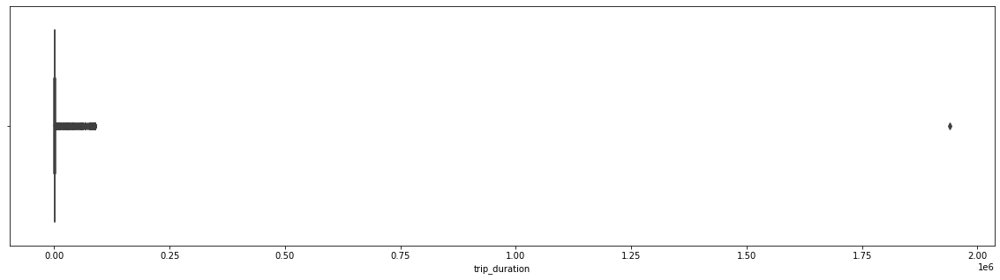

In [32]:
plt.figure(figsize = (20,5))
sns.boxplot(data.trip_duration)
plt.show()

### Observation

- Most of the trips are from 400 seconds to 1075 seconds
- There are outliers which are to be removed.
- Mean and median are not same and mean is greater than median which means the data is right-skewed.
- There are some durations with as low as 1 second. which points towards trips with 0 km distance.

In [33]:
pd.options.display.max_rows = 4000 

In [34]:
data.trip_duration.groupby(pd.cut(data.trip_duration, np.arange(1,max(data.trip_duration),3600))).count()

trip_duration
(1, 3601]             723251
(3601, 7201]            4964
(7201, 10801]             61
(10801, 14401]            15
(14401, 18001]             2
(18001, 21601]             6
(21601, 25201]             6
(25201, 28801]            10
(28801, 32401]            12
(32401, 36001]             2
(36001, 39601]             9
(39601, 43201]             4
(43201, 46801]             4
(46801, 50401]             2
(50401, 54001]             3
(54001, 57601]             3
(57601, 61201]             7
(61201, 64801]             3
(64801, 68401]             4
(68401, 72001]             0
(72001, 75601]             6
(75601, 79201]             7
(79201, 82801]            34
(82801, 86401]           891
(86401, 90001]             0
(90001, 93601]             0
(93601, 97201]             0
(97201, 100801]            0
(100801, 104401]           0
(104401, 108001]           0
(108001, 111601]           0
(111601, 115201]           0
(115201, 118801]           0
(118801, 122401]           0


### Observation
- Most of the trips occurs within 1 hour with some good numbers of trips duration going above 1 hour.
- There are trips with ore than 24 hours of travel duration i.e. 86400 seconds which might have occured for the outstation travels.  

In [35]:
pd.options.display.max_columns = 4000 

In [36]:
data[data.trip_duration > 86400]

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,weekday,month,weekday_num,pick_up_hour,Distance,speed,flag_Y,vendor_id_2,month_2,month_3,month_4,month_5,month_6,weekday_num_1,weekday_num_2,weekday_num_3,weekday_num_4,weekday_num_5,weekday_num_6,pickup_hour_1,pickup_hour_2,pickup_hour_3,pickup_hour_4,pickup_hour_5,pickup_hour_6,pickup_hour_7,pickup_hour_8,pickup_hour_9,pickup_hour_10,pickup_hour_11,pickup_hour_12,pickup_hour_13,pickup_hour_14,pickup_hour_15,pickup_hour_16,pickup_hour_17,pickup_hour_18,pickup_hour_19,pickup_hour_20,pickup_hour_21,pickup_hour_22,pickup_hour_23,passenger_count_1,passenger_count_2,passenger_count_3,passenger_count_4,passenger_count_5,passenger_count_6,passenger_count_7,passenger_count_9
21813,id1864733,1,2016-01-05 00:19:42,2016-01-27 11:08:38,1,-73.78965,40.643559,-73.95681,40.773087,N,1939736,Tuesday,1,1,0,20.148692,0.037394,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


### Obseravtion
- One trip ran for more than 20 days.
- This trip is taken by vendor 1 which they might allow longer trip
- The trip taken on Tuesday in the first month with the distance of 20kms.

#### They fail for correct predictions and they bring inconsistency in the algorithm

In [37]:
data = data[data.trip_duration <= 86400]

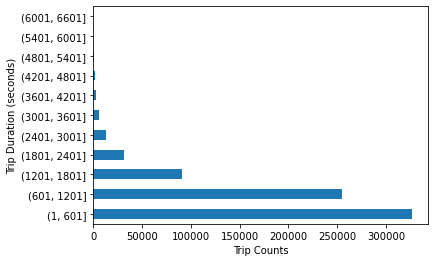

In [38]:
# Visualizing the number of trips taken in slabs of 0-10, 20-30 ... minutes respectively
data.trip_duration.groupby(pd.cut(data.trip_duration, np.arange(1,7200,600))).count().plot(kind='barh')
plt.xlabel('Trip Counts')
plt.ylabel('Trip Duration (seconds)')
plt.show()

### Obseravtion
- Most of the trips took 0 - 30 mins to complete

### Speed
#### Speed is a function of distance and time. Let's visualize speed in different trips.

Maximum speed limit in NYC is as follows:

25 mph in urban area i.e. 40 km/hr

65 mph on controlled state highways i.e. approx 104 km/hr

In [39]:
data['speed'].describe()

count    729319.000000
mean         14.421527
std          12.341036
min           0.000000
25%           9.124341
50%          12.796887
75%          17.844052
max        5640.501776
Name: speed, dtype: float64

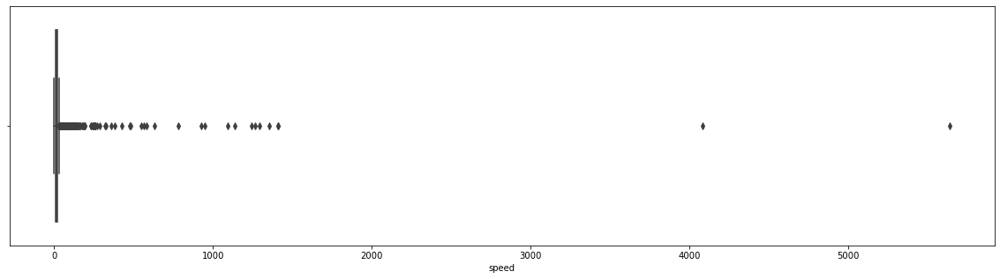

In [40]:
plt.figure(figsize = (20,5))
sns.boxplot(data.speed)
plt.show()

### Observations
- Most of the trips are above 104km/hr. These are the outliers
- The maximun speed is 104km/hr on controlles state highways

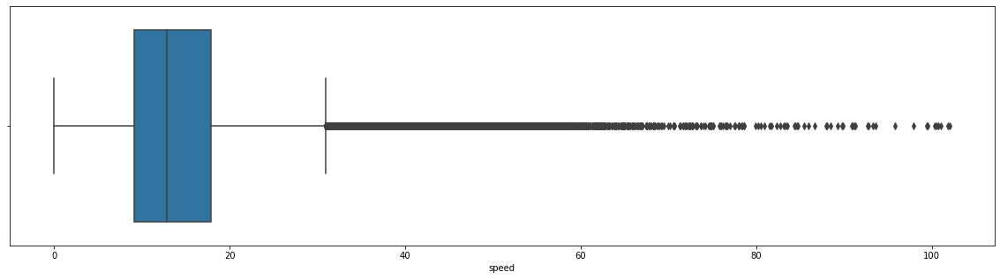

In [41]:
# Removing the speed which are greater than 104km/hr
data = data[data.speed <= 104]
plt.figure(figsize = (20,5))
sns.boxplot(data.speed)
plt.show()

### Observations
- Trips over 30 km/hr are being considered as outliers but we cannot ignore them because they are well under the highest speed limit of 104 km/h on state controlled highways.
- Mostly trips are done at a speed range of 10-20 km/hr with an average speed of around 14 km/hr.

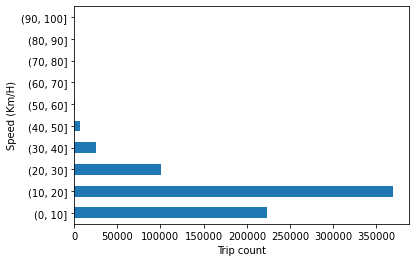

In [42]:
# speed range ditribution
data.speed.groupby(pd.cut(data.speed, np.arange(0,104,10))).count().plot(kind = 'barh')
plt.xlabel('Trip count')
plt.ylabel('Speed (Km/H)')
plt.show()

### Observation
It has been proved from this graph that most of the trips were done at a speed range of 10-20 km/hr.

### Store_and_fwd_flag
#### This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip.

In [43]:
data.flag_Y.value_counts(normalize=True)

0    0.994461
1    0.005539
Name: flag_Y, dtype: float64

### Observations

- Above result shows that only about 0.5% of the trip details were stored in the vehicle first before sending it to the server. 

#### This might have occured because of the following reasons:
1) Outstation trips didn't had proper connection at the time when trip completes.

2) Temporary loss of signals while the trip was about to finish

3) Inconsistent signal reception over the trip duration.

4) The GPS or mobile device battery was down when the trip finished.

In [44]:
data.flag_Y.value_counts()

0    725200
1      4039
Name: flag_Y, dtype: int64

### Observation

- Around 4K trips had to store the flag and then report to the server when the connection was established.

In [45]:
# Distribution for the vendors of the offline trip
data.vendor_id[data.flag_Y == 1].value_counts()

1    4039
Name: vendor_id, dtype: int64

### Observation

#### Above result shows that all the offline trips were taken by vendor 1. We already know that vendor 2 has greater market share as compared to vendor 1. So, there can be two reasons for this scenario.

1) Either vendor 1 utilizes advance technology than vendor 2 to store and forward trip details in case of temporary signal loss.

2) Or vendor 1 uses poor infrastructure which often suffers from the server connection instability due to which they have to store the trip info in the vehicle and send it to the server later when the server connection is back.


In [46]:
pd.options.display.max_rows = 5000 
data[data.flag_Y == 1]

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,weekday,month,weekday_num,pick_up_hour,Distance,speed,flag_Y,vendor_id_2,month_2,month_3,month_4,month_5,month_6,weekday_num_1,weekday_num_2,weekday_num_3,weekday_num_4,weekday_num_5,weekday_num_6,pickup_hour_1,pickup_hour_2,pickup_hour_3,pickup_hour_4,pickup_hour_5,pickup_hour_6,pickup_hour_7,pickup_hour_8,pickup_hour_9,pickup_hour_10,pickup_hour_11,pickup_hour_12,pickup_hour_13,pickup_hour_14,pickup_hour_15,pickup_hour_16,pickup_hour_17,pickup_hour_18,pickup_hour_19,pickup_hour_20,pickup_hour_21,pickup_hour_22,pickup_hour_23,passenger_count_1,passenger_count_2,passenger_count_3,passenger_count_4,passenger_count_5,passenger_count_6,passenger_count_7,passenger_count_9
378,id1347533,1,2016-05-27 18:09:01,2016-05-27 18:16:30,1,-73.976051,40.744671,-73.979721,40.722958,Y,449,Friday,5,4,18,2.434126,19.516379,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0
400,id2733049,1,2016-03-02 20:05:12,2016-03-02 20:52:52,2,-73.978134,40.757484,-73.998955,40.614380,Y,2860,Wednesday,3,2,20,16.009072,20.151279,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0
501,id2484490,1,2016-01-21 08:07:13,2016-01-21 08:18:21,1,-73.999771,40.739487,-73.983940,40.761421,Y,668,Thursday,1,3,8,2.779772,14.980809,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
644,id2090829,1,2016-01-11 12:10:13,2016-01-11 12:25:41,2,-74.013611,40.714310,-73.976601,40.751938,Y,928,Monday,1,0,12,5.218340,20.243560,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1278,id0512889,1,2016-06-10 21:20:14,2016-06-10 21:26:51,1,-73.958183,40.766190,-73.956032,40.782814,Y,397,Friday,6,4,21,1.857414,16.843046,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
1369,id0510811,1,2016-04-07 21:14:30,2016-04-07 21:51:38,1,-73.781944,40.644760,-73.976173,40.670235,Y,2228,Thursday,4,3,21,16.627176,26.866173,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
1740,id0145424,1,2016-03-26 19:51:48,2016-03-26 20:28:33,3,-73.781090,40.644993,-73.983505,40.757534,Y,2205,Saturday,3,5,19,21.160394,34.547581,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
1775,id1186235,1,2016-03-02 15:29:30,2016-03-02 15:53:34,1,-73.981911,40.732754,-73.988914,40.763840,Y,1444,Wednesday,3,2,15,3.506597,8.742210,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2147,id0386498,1,2016-05-08 20:22:58,2016-05-08 20:31:30,1,-73.992294,40.749165,-73.972656,40.755096,Y,512,Sunday,5,6,20,1.780861,12.521682,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
2364,id2711826,1,2016-01-28 18:51:56,2016-01-28 18:57:14,1,-73.982140,40.778580,-73.987648,40.775585,Y,318,Thursday,1,3,18,0.570972,6.463838,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0


### Observation

- Some trips are local some cover longer distance
- Almost each day is listed against offline trips.
- Offline trips were taken almost at all hours as per the search result.
- There is no month which appears to be more dominant in the results.
- Even the trip duration covers different scales.

#### So all in all there doesn't seems to be any relation with either of the metric for the offline 

### Total Trips per hour

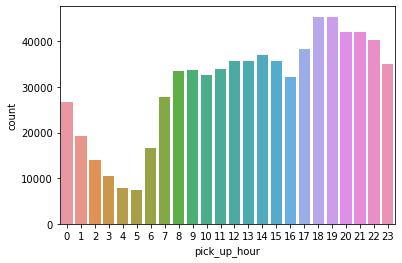

In [47]:
#  Distribution of the pickups across the 24 hour time scale.
sns.countplot(data.pick_up_hour)
plt.show()

### Observation
-  Taxi pickups which starts increasing from 6AM in the morning and then declines from late evening i.e. around 7 PM. 



### Total trips per weekday


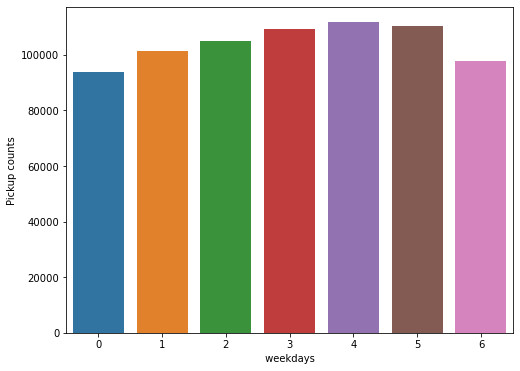

In [48]:
# Distribution of taxi pickup across the week
plt.figure(figsize = (8,6))
sns.countplot(data.weekday_num)
plt.xlabel(' weekdays ')
plt.ylabel('Pickup counts')
plt.show()

### Observation
- Increasing trend of taxi pickups starting from Monday till Friday. The trend starts declining from saturday till monday which is normal where some office going people likes to stay at home for rest on the weekends.

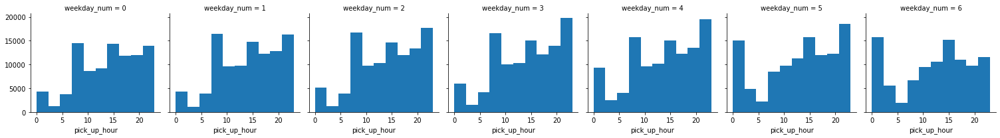

In [49]:
# Hourwise pickup pattern across the week
n = sns.FacetGrid(data, col='weekday_num')
n.map(plt.hist, 'pick_up_hour')
plt.show()

### Observation

- Taxi pickups increased in the late night hours over the weekend possibly due to more outstation rides or for the late night leisures nearby activities.

- Early morning pickups i.e before 5 AM have increased over the weekend in comparison to the office hours pickups i.e. after 7 AM which have decreased due to obvious reasons.

- Taxi pickups seems to be consistent across the week at 15 Hours i.e. at 3 PM.

### Total trips per month


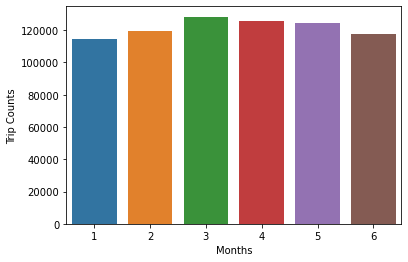

In [50]:
# Distribution of trip across the months
sns.countplot(data.month)
plt.ylabel('Trip Counts')
plt.xlabel('Months')
plt.show()

### Observation
- There is balance in the trip across months

### Bivariate Analysis


### Trip duration per hour

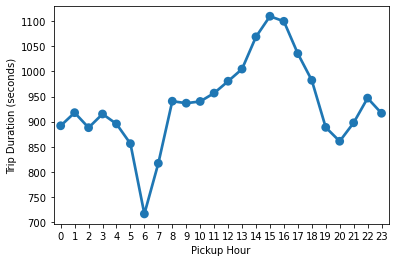

In [51]:
group1 = data.groupby('pick_up_hour').trip_duration.mean()
sns.pointplot(group1.index, group1.values)
plt.ylabel('Trip Duration (seconds)')
plt.xlabel('Pickup Hour')
plt.show()

### Observation

- Average trip duration is lowest at 6 AM when there is minimal traffic on the roads.

- Average trip duration is generally highest around 3 PM during the busy streets.

- Trip duration on an average is similar during early morning hours i.e. before 6 AM & late evening hours i.e. after 6 PM.

### Trip duration per weekday

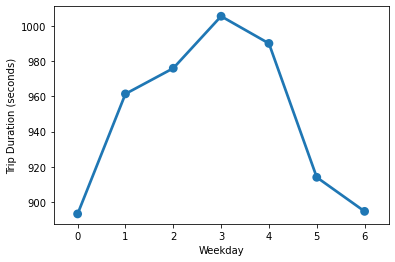

In [52]:
group2 = data.groupby('weekday_num').trip_duration.mean()
sns.pointplot(group2.index, group2.values)
plt.ylabel('Trip Duration (seconds)')
plt.xlabel('Weekday')
plt.show()

### Observation
- Trip duration is almost equally distributed across the week on a scale of 0-1000 minutes with minimal difference in the duration times.

- Trip duration on thursday is longest among all days.

### Trip duration per month

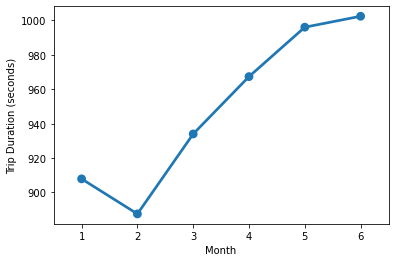

In [53]:
group3 = data.groupby('month').trip_duration.mean()
sns.pointplot(group3.index, group3.values)
plt.ylabel('Trip Duration (seconds)')
plt.xlabel('Month')
plt.show()

### Observation
- Increasing trend in the average trip duration along with each subsequent month.

- The duration difference between each month is not much. It has increased gradually over a period of 6 months.

- It is lowest during february when winters starts declining.

- There might be some seasonal parameters like wind/rain which can be a factor of this gradual increase in trip duration over a period. Like May is generally the rainy season in NYC and which is inline with our visualization. As it generally takes longer on the roads due to traffic jams during rainy season. So natually the trip duration would increase towards April May and June.

### Trip Duration per vendor

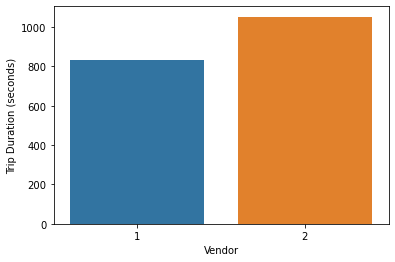

In [54]:
group4 = data.groupby('vendor_id').trip_duration.mean()
sns.barplot(group4.index, group4.values)
plt.ylabel('Trip Duration (seconds)')
plt.xlabel('Vendor')
plt.show()

### Observation

- Average trip duration for vendor 2 is higher than vendor 1 by approx 200 seconds i.e. atleast 3 minutes per trip.

### Trip Duration Vs. flag

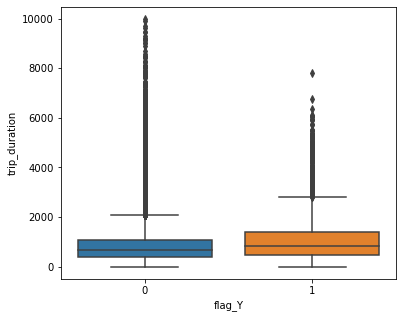

In [55]:
plt.figure(figsize = (6,5))
plot_dur = data.loc[(data.trip_duration < 10000)]
sns.boxplot(x = "flag_Y", y = "trip_duration", data = plot_dur)
plt.show()

### Observation
- Trip durations scale is less for the trips where the flag is set i.e. the trip details are stored before sending it to the server.
- Trip duration outliers are also less for the trips with flag 'Y' as compared the trips with flag 'N'.
- Trip duration is longer for the trips where the flag is not set.
- Inter quartile range of trip duration is more for the trips with the flag 'Y' as compared to the trips with flag 'N' but the median value is almost equal for both.

### Distance per hour

#### Trip distance must be more or less proportional to the trip duration if we ignore general traffic and other stuff on the road.

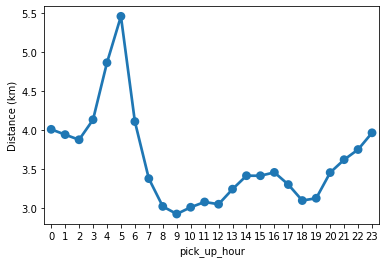

In [56]:
group5 = data.groupby('pick_up_hour').Distance.mean()
sns.pointplot(group5.index, group5.values)
plt.ylabel('Distance (km)')
plt.show()

### Observation

- Trip distance is highest during early morning hours which can account for some things like:

        1) Outstation trips taken during the weekends.

        2) Longer trips towards the city airport which is located in the outskirts of the city.

- Trip distance is fairly equal from morning till the evening varying around 3 - 3.5 kms.

- It starts increasing gradually towards the late night hours starting from evening till 5 AM and decrease steeply towards morning.

### Distance per weekday

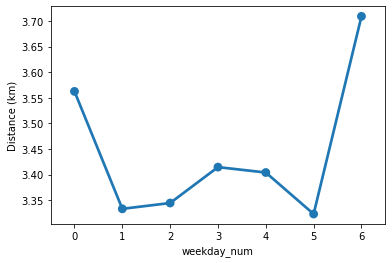

In [57]:
group6 = data.groupby('weekday_num').Distance.mean()
sns.pointplot(group6.index, group6.values)
plt.ylabel('Distance (km)')
plt.show()

### Observation

- Sunday to be in the top may be due to outstation trips or night trips towards the airport.

- Equal distribution with n average distance around 3.5 km/hr

### Distance per month

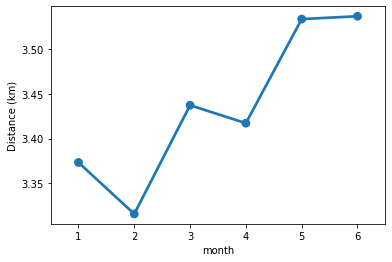

In [58]:
group7 = data.groupby('month').Distance.mean()
sns.pointplot(group7.index, group7.values)
plt.ylabel('Distance (km)')
plt.show()

### Observation

- The distibution is almost equivalent, varying mostly around 3.5 km/hr with 5th month being the highest in the average distance and 2nd month being the lowest.

### Distance per vendor

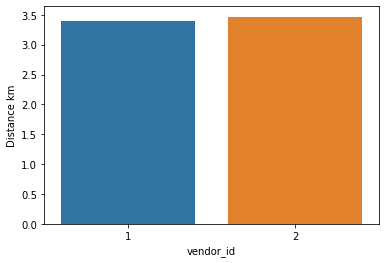

In [59]:
group8 = data.groupby('vendor_id').Distance.mean()
sns.barplot(group8.index, group8.values)
plt.ylabel("Distance km")
plt.show()

### Observation

- Both the vendores are in the same with respect to distance

### Distance Vs Flag

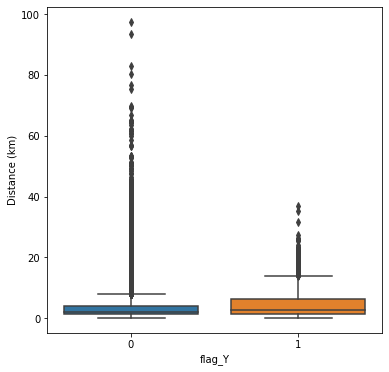

In [60]:
plt.figure(figsize = (6,6))
plot_dist = data.loc[(data.Distance < 100)]
sns.boxplot(x = "flag_Y", y = "Distance", data = plot_dist)
plt.ylabel('Distance (km)')
plt.show()

### Observation

- Interquartile range of distance is almost twice for Flag 'Y' trips as compared to the Flag 'N' trips

- Median value is much different in both the case as well.

- The range of distance and trip duration for the Flag 'Y' trips is much more limited and confined as compared with the flag 'N' trips and this also resulted in much less number of outliers for Flag 'Y' trips.

### Distance Vs. Trip duration

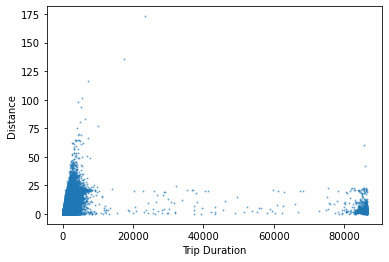

In [61]:
plt.scatter(data.trip_duration, data.Distance , s=1, alpha=0.5)
plt.ylabel('Distance')
plt.xlabel('Trip Duration')
plt.show()

### Observation

- There are lots of trips which covered negligible distance but clocked more than 20,000 seconds in terms of the Duration.

- Initially there is some proper correlation between the distance covered and the trip duration in the graph. but later on it all seems uncorrelated.

- There were few trips which covered huge distance of approx 200 kms within very less time frame, which is unlikely and should be treated as outliers.

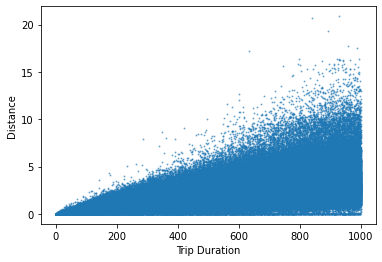

In [62]:
# Graph area where distance is < 50 km and duration is < 1000 seconds
dur_dist = data.loc[(data.Distance < 50) & (data.trip_duration < 1000), ['Distance','trip_duration']]
plt.scatter(dur_dist.trip_duration, dur_dist.Distance , s=1, alpha=0.5)
plt.ylabel('Distance')
plt.xlabel('Trip Duration')
plt.show()

### Observation

- There should have been a linear relationship between the distance covered and trip duration on an average but we can see dense collection of the trips in the lower right corner which showcase many trips with the inconsistent readings.

### Idea:

- Remove those trips which covered 0 km distance but clocked more than 1 minute to make our data more consistent for predictive model. Because if the trip was cancelled after booking, than that should not have taken more than a minute time. This is our assumption.

In [63]:
data = data[~((data.Distance == 0) & (data.trip_duration >= 60))]

### Observation

- Now, Instead of looking at each and every trip, we should approximate and try to filter those trips which covered less than 1 km distance and but clocked more than an hour.

In [64]:
duo = data.loc[(data['Distance'] <= 1) & (data['trip_duration'] >= 3600),['Distance','trip_duration']].reset_index(drop=True)

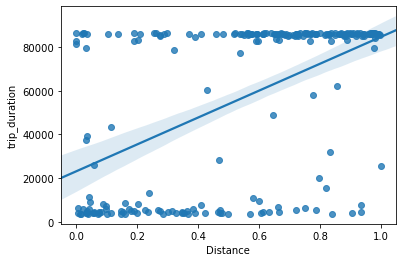

In [65]:
sns.regplot(duo.Distance, duo.trip_duration)
plt.show()

### Observations:

- Though the straight line tries to show some linear relation between the two. But there seems to be negligible correlation between these two metric as seen from the scatter plot where it should have been a linear distribution.

- It is rarely occurs that customer keep sitting in the taxi for more than an hour and it does not travel for even 1 km.

#### These should be removed to bring in more consistency to our results.

In [66]:
data = data[~((data['Distance'] <= 1) & (data['trip_duration'] >= 3600))]

### Average speed per hour

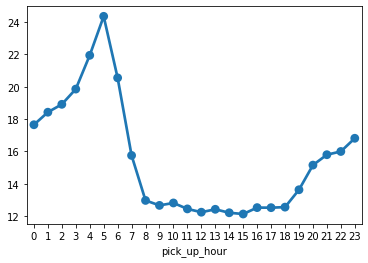

In [67]:
group9 = data.groupby('pick_up_hour').speed.mean()
sns.pointplot(group9.index, group9.values)
plt.show()

### Observation

- The average trend is totally inline with the normal circumstances.

- Average speed tend to increase after late evening and continues to increase gradually till the late early morning hours.

- Average taxi speed is highest at 5 AM in the morning, then it declines steeply as the office hours approaches.

- Average taxi speed is more or less same during the office hours i.e. from 8 AM till 6PM in the evening.

### Average speed per weekday

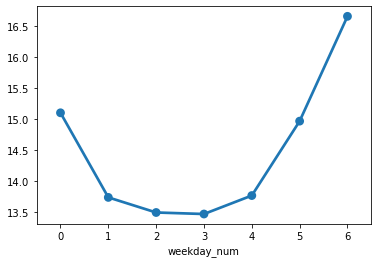

In [68]:
group10 = data.groupby('weekday_num').speed.mean()
sns.pointplot(group10.index, group10.values)
plt.show()

### Observations

- Average taxi speed is higher on weekend as compared to the weekdays which is obvious when there is mostly rush of office goers and business owners.

- Even on monday the average taxi speed is shown higher which is quite surprising when it is one of the most busiest day after the weekend. There can be several possibility for such behaviour
        1) Lot of customers who come back from outstation in early hours of Monday before 6 AM to attend office on time.
        2) Early morning hours customers who come from the airports after vacation to attend office/business on time for the coming week.

- There could be some more reasons as well which only a local must be aware of.

### Passenger count per vendor

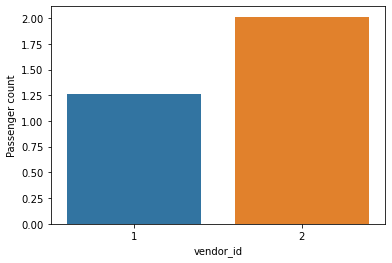

In [69]:
group9 = data.groupby('vendor_id').passenger_count.mean()
sns.barplot(group9.index, group9.values)
plt.ylabel('Passenger count')
plt.show()

### Observation

- Vendor 2 trips generally consist of 2 passengers as compared to the vendor 1 with 1 passenger.

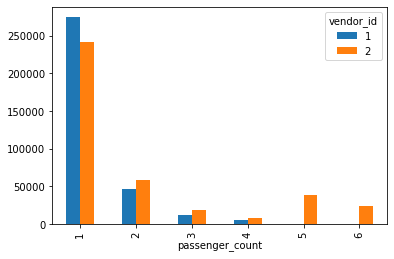

In [70]:
data.groupby('passenger_count').vendor_id.value_counts().reset_index(name='count').pivot("passenger_count","vendor_id","count").plot(kind='bar')
plt.show()

### Observation

- Most of the big cars are served by the Vendor 2 including minivans because other than passenger 1, vendor 2 has majority in serving more than 1 passenger count and that explains it greater share of the market.

### Map Visualization

- Visualize the Taxi pickup locations by placing longitude and latitude marker on the MAP of the US. So that we can analyze below questions:

- Are all pickups constrained to NYC and it's surrounding areas?

- Is there any unusual location of the pickup?

- Are the latitude longitude constrained to the land area of the US and nowhere else?

In [71]:
def map_marker(set):
    # Import package for map
    from mpl_toolkits.basemap import Basemap
    plt.figure(figsize = (20,20))

    # Set the limits of the map to the minimum and maximum coordinates
    lat_min = data["pickup_latitude"].min() - .2
    lat_max = data["pickup_latitude"].max() + .2
    lon_min = data["pickup_longitude"].min() - .2
    lon_max = data["pickup_longitude"].max() + .2

    # Set the center of the map
    cent_lat = (lat_min + lat_max) / 2
    cent_lon = (lon_min + lon_max) / 2

    #Create the Basemap object with required params.
    map = Basemap(llcrnrlon=lon_min,
                  llcrnrlat=lat_min,
                  urcrnrlon=lon_max,
                  urcrnrlat=lat_max,
                  resolution='l',
                  projection='tmerc',
                  lat_0 = cent_lat,
                  lon_0 = cent_lon)

    #Style the map
    map.drawmapboundary()
    map.drawcoastlines()
    map.fillcontinents()
    map.drawcountries(linewidth=2)
    map.drawstates()


    #Fetch the long and lat in form of array
    long = np.array(data["pickup_longitude"])
    lat = np.array(data["pickup_latitude"])

    x, y = map(long, lat)
    map.plot(x, y,'ro', markersize=2, alpha=1)

    plt.show()

### Taxi pickup location


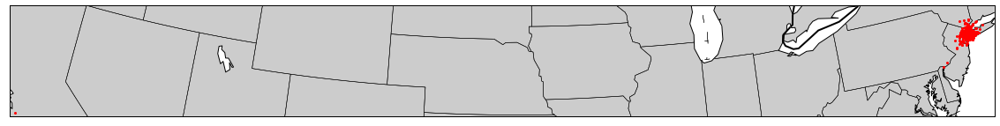

In [72]:
map_marker(data)

### Observation

- One unusual pickup from the CA state.

- There are quite a few pickup from the neighbouring state as well. Some are quite far and some very near to the NYC state

In [73]:
#CA state pickup
data[data.pickup_longitude == data.pickup_longitude.min()]

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,weekday,month,weekday_num,pick_up_hour,Distance,speed,flag_Y,vendor_id_2,month_2,month_3,month_4,month_5,month_6,weekday_num_1,weekday_num_2,weekday_num_3,weekday_num_4,weekday_num_5,weekday_num_6,pickup_hour_1,pickup_hour_2,pickup_hour_3,pickup_hour_4,pickup_hour_5,pickup_hour_6,pickup_hour_7,pickup_hour_8,pickup_hour_9,pickup_hour_10,pickup_hour_11,pickup_hour_12,pickup_hour_13,pickup_hour_14,pickup_hour_15,pickup_hour_16,pickup_hour_17,pickup_hour_18,pickup_hour_19,pickup_hour_20,pickup_hour_21,pickup_hour_22,pickup_hour_23,passenger_count_1,passenger_count_2,passenger_count_3,passenger_count_4,passenger_count_5,passenger_count_6,passenger_count_7,passenger_count_9
421819,id2854272,2,2016-02-26 13:50:19,2016-02-26 13:58:38,2,-121.933342,37.389381,-121.933304,37.389511,N,499,Friday,2,4,13,0.014811,0.106849,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


### Observation
- The trip duration is approx 8 minutes still the distance travelled is just in few meters.

- Moreover the Latitude and Longitude readings are same.

- These are the outliers and should be removed for the consistency of the model

In [74]:
data = data[data.pickup_longitude != data.pickup_longitude.min()]

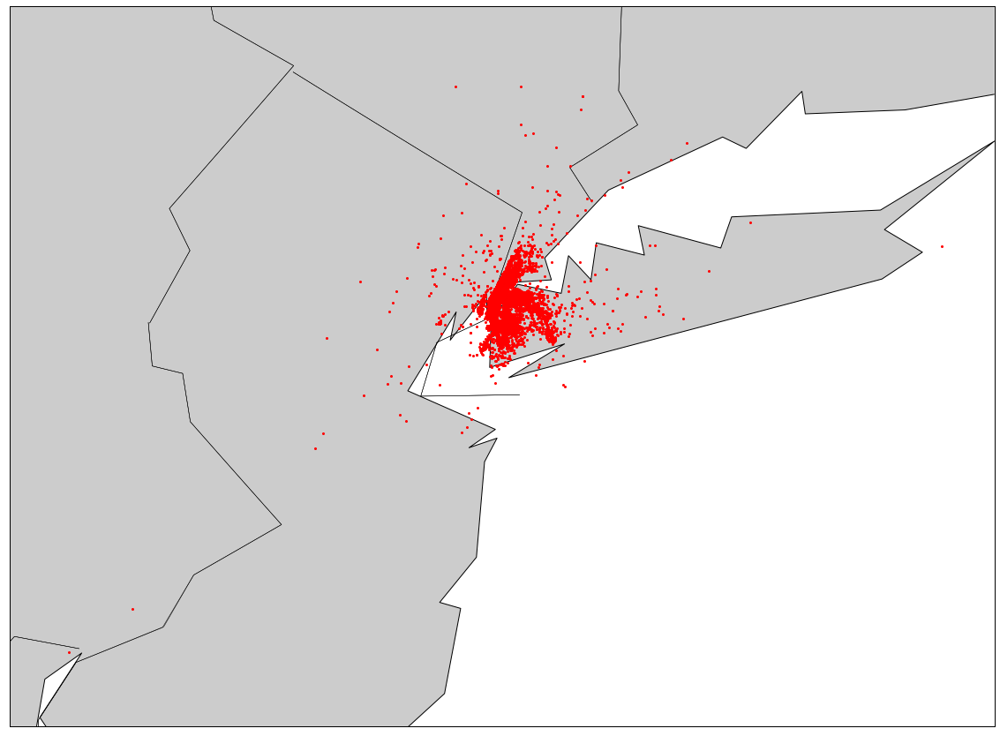

In [75]:
map_marker(data)

### Observation

- There are quite a few pickups being shown off the NYC coast i.e. in the Atlantic ocean.

- Most of the pickups are being shown in and around NYC area.

### NYC pickup locations

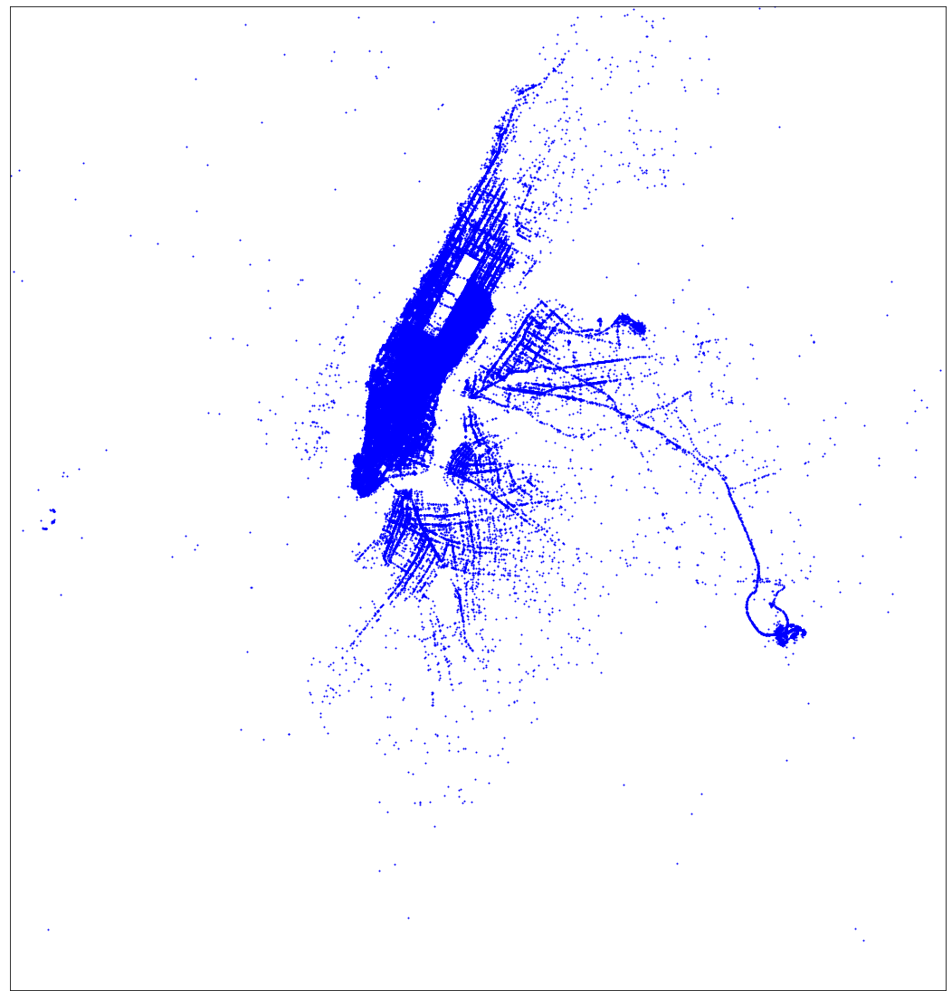

In [76]:
plt.figure(figsize=(20,20))
from mpl_toolkits.basemap import Basemap

# Set the limits of the map to the minimum and maximum coordinates
lat_min = 40.5
lat_max = 40.9
lon_min = -74.2
lon_max = -73.7

# Set the center of the map
cent_lat = (lat_min + lat_max) / 2
cent_lon = (lon_min + lon_max) / 2

#Create the Basemap object with required params.
map = Basemap(llcrnrlon=lon_min,
              llcrnrlat=lat_min,
              urcrnrlon=lon_max,
              urcrnrlat=lat_max,
              resolution='l',
              projection='tmerc',
              lat_0 = cent_lat,
              lon_0 = cent_lon)

#Style the map
# map.drawcounties()

#Fetch the long and lat in form of array
long = np.array(data["pickup_longitude"])
lat = np.array(data["pickup_latitude"])

x, y = map(long, lat)
map.plot(x, y,'bo', markersize=1, alpha=1)
plt.xticks()
plt.show()

### Observations

- Most of the taxi pickups were done in the manhattan area as compared to the other areas in NYC.
- A long trail towards the airport shows that the airport is situated quite far from the Manhattan area.
- There must have been some long distance rides towards and from the airport.
- Similarly the average duration for the rides picked-up to or for the airport would have been longer.

### NYC drop off location

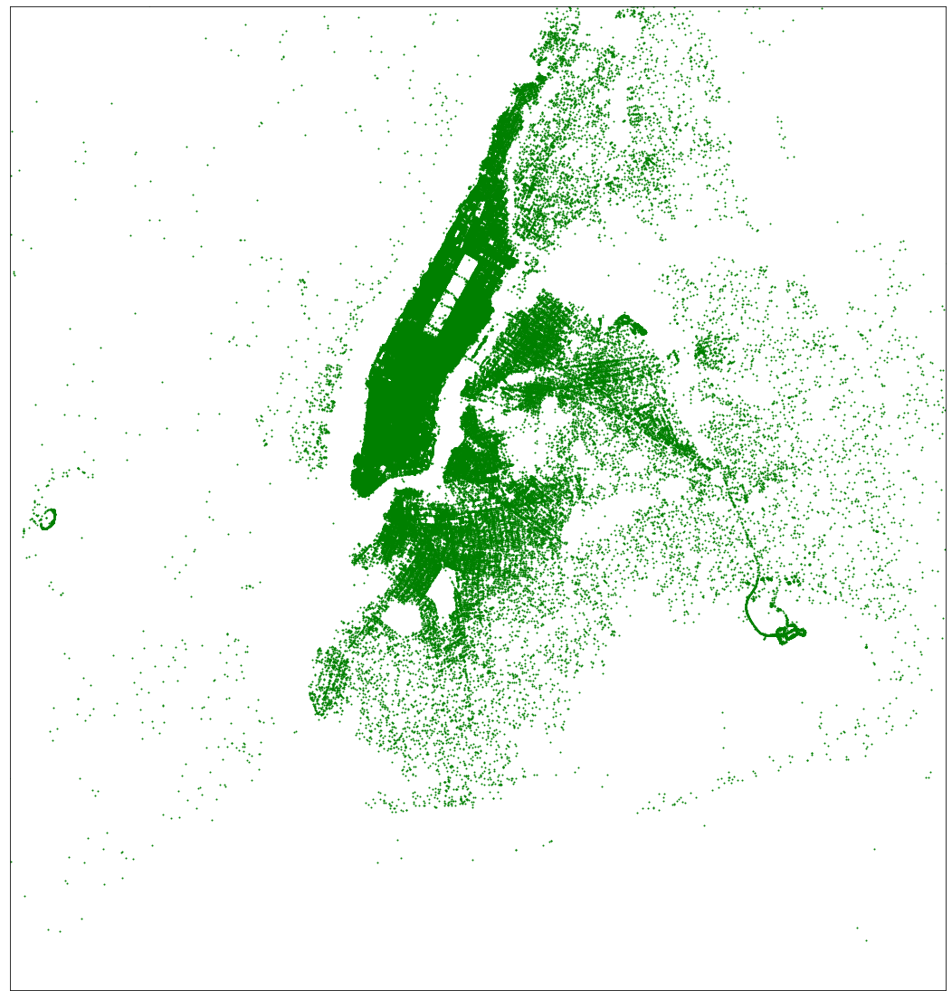

In [77]:
plt.figure(figsize=(20,20))

# Set the limits of the map to the minimum and maximum coordinates
lat_min = 40.5
lat_max = 40.9
lon_min = -74.2
lon_max = -73.7

# Set the center of the map
cent_lat = (lat_min + lat_max) / 2
cent_lon = (lon_min + lon_max) / 2

#Create the Basemap object with required params.
map = Basemap(llcrnrlon=lon_min,
              llcrnrlat=lat_min,
              urcrnrlon=lon_max,
              urcrnrlat=lat_max,
              resolution='l',
              projection='tmerc',
              lat_0 = cent_lat,
              lon_0 = cent_lon)

#Style the map
# map.drawcounties()

#Fetch the long and lat in form of array
long = np.array(data["dropoff_longitude"])
lat = np.array(data["dropoff_latitude"])

x, y = map(long, lat)
map.plot(x, y,'go', markersize=1, alpha=1)
plt.xticks()
plt.show()

### Observation

- Dropoff's are much more distributed around the NYC area where still most of the dropoff's were done in the Manhattan.

### Question:

- Does that mean there were more dropoff's than the pickup's?

### Idea:

- Though the dropoffs seems to be larger in number than the pickups. But for each pickup we have a associated dropoffs in the dataset. It's just that the pickups were majorly concentrated in the Manhattan area.